In [1]:
import xarray as xr
import matplotlib as plt

In [32]:
import matplotlib.colors as colors
import cmocean as cm

In [18]:
population = xr.open_dataset('../data/gpw-v4-population-count-rev11_totpop_2pt5_min_nc/gpw_v4_population_count_rev11_2pt5_min.nc')

In [22]:
population = population.rename({'Population Count, v4.11 (2000, 2005, 2010, 2015, 2020): 2.5 arc-minutes':'population'})

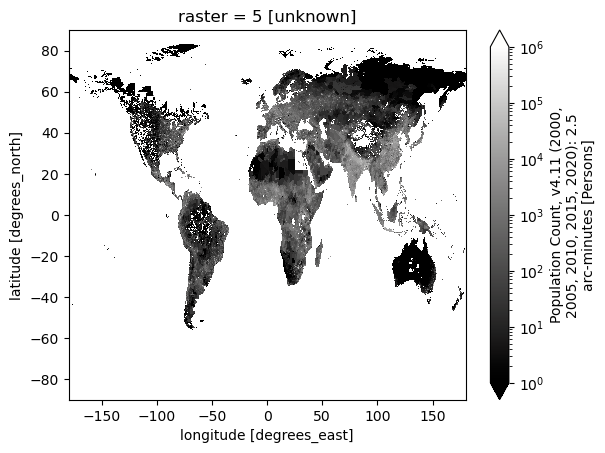

In [34]:
population.population.isel(raster=4).plot(norm=colors.LogNorm(vmin=1, vmax=1e6),cmap=cm.cm.gray)

In [30]:
lon = population.longitude
lat = population.latitude

In [31]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy
import matplotlib.path as mpath
import os
from matplotlib.image import imread

import matplotlib.pyplot as plt
import cmocean as cm
from matplotlib import colors

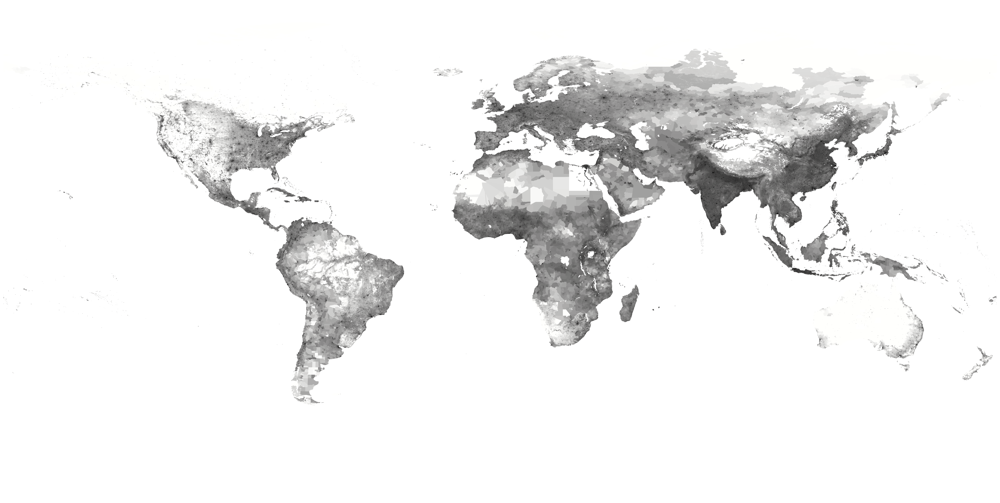

In [54]:

fig = plt.figure(figsize=(30,30),dpi=300, constrained_layout=True)
ax = fig.add_subplot(111,projection=ccrs.PlateCarree())

ax.set_facecolor('black')

data2plot = population.population.isel(raster=4)

ax.pcolormesh(lon,lat,data2plot, norm=colors.LogNorm(vmin=1, vmax=1e6), rasterized=True, transform=ccrs.PlateCarree(), cmap=cm.cm.gray_r)

land_10m = cfeature.NaturalEarthFeature('physical', 'land', '10m')

ax.add_feature(land_10m, facecolor='white', edgecolor='white',linewidth=0.3,zorder=-1)

# gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False,
                #   linewidth=4, color='black', alpha=0.5, linestyle='--')

# ax.set_extent([0, 360, -90, 90], ccrs.PlateCarree())

ax.axis('off')

plt.savefig('../textures/population_log.tif',dpi=300)
# plt.cla()

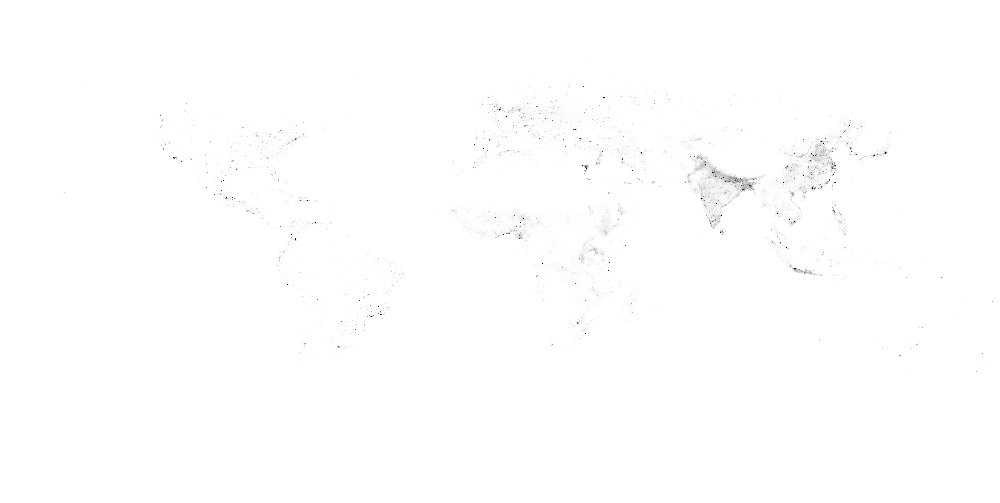

In [56]:
fig = plt.figure(figsize=(30,30),dpi=300, constrained_layout=True)
ax = fig.add_subplot(111,projection=ccrs.PlateCarree())

ax.set_facecolor('black')

data2plot = population.population.isel(raster=4)

ax.pcolormesh(lon,lat,data2plot, vmin=1, vmax=1e5, rasterized=True, transform=ccrs.PlateCarree(), cmap=cm.cm.gray_r)

land_10m = cfeature.NaturalEarthFeature('physical', 'land', '10m')

ax.add_feature(land_10m, facecolor='white', edgecolor='white',linewidth=0.3,zorder=-1)

# gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=False,
                #   linewidth=4, color='black', alpha=0.5, linestyle='--')

# ax.set_extent([0, 360, -90, 90], ccrs.PlateCarree())

ax.axis('off')

plt.savefig('../textures/population.tif',dpi=300)
# plt.cla()